<center>
<h1>Mejor Ubicación Hospital</h1>
    <h3>Manuel Arias  &nbsp;  &nbsp; Lina Prado</h3>
    <h3>Jeisson Prieto  &nbsp;  &nbsp; Cristian Pulido </h3>
    <h3>Julián Torres</h3>
</center>


In [269]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

In [270]:
import numpy as np
import scipy
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import multivariate_normal
import matplotlib.colors as mcolors
from scipy import integrate
from scipy.optimize import minimize
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.figure_factory as ff
init_notebook_mode(connected=True)
from scipy.optimize import curve_fit
from plotly import tools

In [271]:
# np.inf distancia del maximo
def norma(x,orden=2):
    return np.linalg.norm(x,axis=1,ord=orden)

<center>
<h2>Registros Distancia vs. Tiempo</h2>  

<table style="border-collapse:collapse;border-spacing:0" class="tg"><tr><th style="font-family:Arial, sans-serif;font-size:14px;font-weight:bold;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center">Distancia (Kms)</th><th style="font-family:Arial, sans-serif;font-size:14px;font-weight:bold;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center">Tiempo</th><th style="font-family:Arial, sans-serif;font-size:14px;font-weight:bold;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">-<br></th><th style="font-family:Arial, sans-serif;font-size:14px;font-weight:bold;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">Distancia (Kms)</th><th style="font-family:Arial, sans-serif;font-size:14px;font-weight:bold;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">Tiempo</th></tr><tr><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center">1.22</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center">2.62</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">|</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">3.19</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">4.26</td></tr><tr><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center">3.48</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center">8.35</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">|<br></td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">4.11</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">7.00</td></tr><tr><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center">5.10</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center">6.52</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">|</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">3.09</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">5.49</td></tr><tr><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center">3.39</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center">3.51</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">|<br></td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">4.96</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">7.64</td></tr><tr><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center">4.13</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center">6.52</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">|</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">1.64</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">3.09</td></tr><tr><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center">1.75</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center">2.46</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">|</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">3.23</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">3.89</td></tr><tr><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center">2.95</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center">5.02</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">|</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">3.07</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">5.49</td></tr><tr><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center">1.30</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center">1.73</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">|</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">4.26</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">6.82</td></tr><tr><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center">0.76</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center">1.14</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">|</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">4.40</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">5.53</td></tr><tr><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">2.52</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">4.56</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">|<br></td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">2.42</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">4.30</td></tr><tr><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">1.66</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">2.90</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">|</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">2.96</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">3.55</td></tr><tr><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">1.84</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top">3.19</td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top"></td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top"></td><td style="font-family:Arial, sans-serif;font-size:14px;padding:10px 5px;border-style:solid;border-width:1px;overflow:hidden;word-break:normal;border-color:black;text-align:center;vertical-align:top"></td></tr></table>



</center>

In [285]:
registros=[[1.22, 2.62],[3.19, 4.26],[3.48,8.35],[4.11,7.00],[5.10,6.52],[3.09,5.49],[3.39,3.51],[4.96,7.64],[4.13,6.52],[1.64,3.09],[1.75,2.46],[3.23,3.89],[2.95,5.02],[3.07,5.49],[1.30,1.73],[4.26,6.82],[0.76,1.14],[4.40,5.53],[2.52,4.56],[2.42,4.30],[1.66,2.90],[2.96,3.55],[1.84,3.19],[0,0]]
registros=pd.DataFrame(registros,columns=['Distancia','Tiempo']).sort_values('Distancia').reset_index(drop=True)

In [286]:
trace = go.Scatter(
    x = registros.Distancia[1:],
    y = registros.Tiempo[1:],
    mode = 'markers',
    name = 'Registros'
    
)
point = go.Scatter(
    x = [0],
    y = [0],
    mode = 'markers',
    name = 'Origen'
)
layout = go.Layout(
    title='Registros Distancia Vs. Tiempo',
    font=dict(family='Courier New, monospace', size=18, color='#7f7f7f'),
    xaxis=dict(
        title='Distancia',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    ),
    yaxis=dict(
        title='Tiempo',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    )
)


data = [trace,point]
fig = go.Figure(data=data, layout=layout)
# Plot and embed in ipython notebook!
iplot(fig)

## Hipótesis
<ul>
    <li>La velocidad de una ambulancia es constante, en el sentido que el tiempo que tarda en
hacer  un  recorrido  de  cierta  distancia  no  se  ve  afectado  por  la  zona  de  la  ciudad  que
transite.</li>
   
</ul>


<h2> Aproximación de la función tiepo de llegada de una ambulancia$:= t(x)$</h2>
<ul>
    <li> Interpolación splines cúbicos </li>
    <li> Ajuste Lineal</li>
    <li> Ajuste Cuadratico</li>
    <li> Ajuste Cúbico</li>
</ul>



In [287]:
xs = np.sort(list(np.arange(0, max(registros.Distancia), 0.1))+list(registros.Distancia))
for i in xs:
    registros=registros.append({'Distancia':i},ignore_index=True)
registros=registros.drop_duplicates('Distancia').sort_values('Distancia').reset_index(drop=True)
originales=registros[['Distancia','Tiempo']].dropna()

In [288]:
cubic_spline=scipy.interpolate.CubicSpline(originales.Distancia, originales.Tiempo, axis=0, bc_type='not-a-knot', extrapolate=None)

In [289]:
registros['Spline']=cubic_spline(registros.Distancia)
registros['Spline_error']=abs(registros.Tiempo-registros.Spline)

In [290]:
def polinomio_ajuste(x,y,grado):
    
    columns=grado#+1
    filas = len(x)
    
    matriz=np.ones((filas,columns))
    
    for i in range(columns):
        matriz[:,i]=np.power(x,i+1)
        # matriz[:,i]=np.power(x,i) para considerar coeficiente independiente
    
    y=np.array(y).reshape((len(y),1))
    
    coef=np.dot(np.dot(np.linalg.inv(np.dot(matriz.T,matriz)),matriz.T),y)
    
    y_approx=np.dot(matriz,coef)
    
    return coef, y_approx

def evaluar_polinomio(x,coeficientes):
    return np.dot(np.array([np.power(x,len(coeficientes)-i) for i in range(len(coeficientes))]).T,coeficientes).flatten()
    #len(coeficientes)-1-i para considerar coeficiente independiente
    

In [291]:
polinomios=[]
for i,j in zip([1,2,3],['Lineal','Cuadratico','Cúbico']):
    coef,t_approx=polinomio_ajuste(originales.Distancia,originales.Tiempo,i)
    polinomios.append(coef)
    registros[j]=evaluar_polinomio(registros.Distancia,coef)
    registros[j+'_error']=abs(registros[j]-registros.Tiempo)  


In [292]:
aproximaciones=[]
for i in ['Spline','Lineal','Cuadratico','Cúbico']:
    grafica=go.Scatter(
        x = registros.Distancia,
        y = registros[i],

        mode = 'lines',
        name = i,
        error_y=dict(
                type='data',
                array=registros[i+'_error'],
                visible=True
                )

    )
    
    
    aproximaciones.append(grafica)
data = data+aproximaciones
fig = go.Figure(data=data, layout=layout)
# Plot and embed in ipython notebook!
iplot(fig)

<center>
    <h2> Errores de Estimación </h2>
</center>
        

In [293]:
Errores=pd.DataFrame(registros[['Spline_error','Lineal_error','Cuadratico_error','Cúbico_error']].sum(),columns=['Error Estimación'])
iplot([ go.Bar( x=Errores['Error Estimación'],  y=list(Errores.index),  orientation='h' )])

In [294]:
soluciones={}
grado_funcion=Errores.reset_index(drop=True)[1:].idxmin().values[0]
distance_order=2 #np.inf 

In [330]:
from IPython.display import Markdown as md
# Instead of setting the cell to Markdown, create Markdown from withnin a code cell!
# We can just use python variable replacement syntax to make the text dynamic
c_1=polinomios[grado_funcion-1].flatten()[0]
md("<h2> Escogemos la función linal por que... </h2><ul><li>Es la que menor error de estimación posee</li>    <li>Es capaz de generalizar a puntos que no se tomaron en cuenta</li>    <li>Cumple con la hipótesis de velocidad constante de la ambulancia, por tanto mientras más distancia recorra más tiempo le debe tomar</li></ul>$$t(x)={}x$$".format(c_1))

<h2> Escogemos la función linal por que... </h2><ul><li>Es la que menor error de estimación posee</li>    <li>Es capaz de generalizar a puntos que no se tomaron en cuenta</li>    <li>Cumple con la hipótesis de velocidad constante de la ambulancia, por tanto mientras más distancia recorra más tiempo le debe tomar</li></ul>$$t(x)=1.5385190540605596x$$

In [298]:
def t(emergencia,hospital,coeficientes=polinomios[grado_funcion-1],distance_order=2):
    return evaluar_polinomio(norma(np.array(emergencia)-np.array(hospital),distance_order),coeficientes)

In [299]:
frequency = np.array([[ 0,2,3,1,1,1], 
                      [10,6,3,1,3,1],
                      [ 8,5,2,1,0,0],
                      [ 5,3,3,0,1,2],
                      [ 2,1,1,2,3,2],
                      [ 3,0,1,4,2,1]])

In [300]:
means = []
for row in range(6):
    for col in range(6):
        means.append([col+0.5,  row+0.5])
means=np.array(means)


## Frecuencia Lamadas

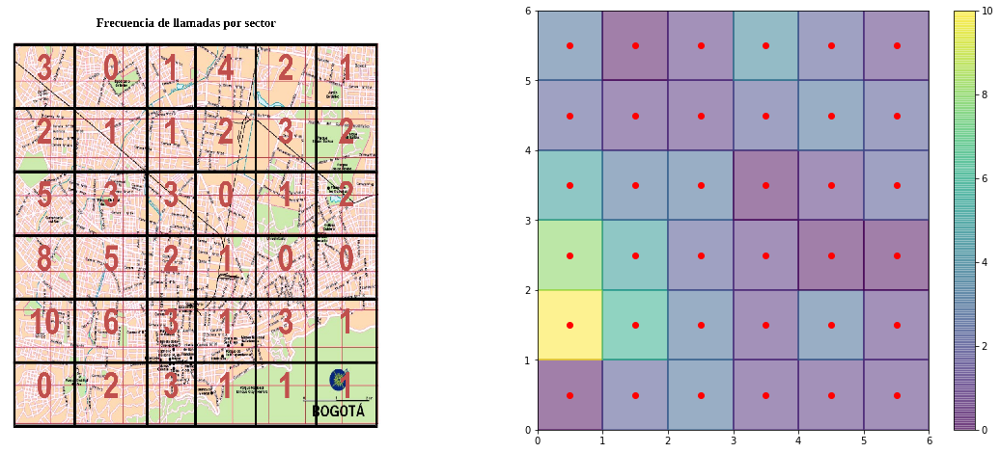

In [301]:
X,Y=np.meshgrid(np.arange(7),np.arange(7))

fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(20,8))
ax1.imshow(plt.imread("img.png"))
ax1.axis('off')
im=ax2.pcolormesh(X,Y,frequency,cmap='viridis',edgecolors='face',alpha=0.5,snap=True)
ax2.scatter(means[:,0],means[:,1],c='r')
fig.colorbar(im, ax=ax2)
plt.show()

# Modelo Discreto

## Hipótesis
<ul>
    <li>Que  la  ambulancia  llegue  al  centro  de  la  cuadricula  donde  se  produjo  una  emergencia
implica que dicha emergencia ha sido atendida.</li>
    <li>El hospital puede ser ubicado en cualquier parte de la ciudad.</li>
    <li>Las llamadas de emergencia son independientes entre si</li>
    <li>Todas las llamadas de una cuadrícula suceden en el centro de esta</li>
</ul>

### Sean $f(x_i,y_i)$ la función que retorna la frecuencia de llamadas del punto central de una región y $d((x_1,y_1),(x_2,y_2))$ la función que retorna la distancia entre dos puntos, la función a optimizar se define como:
$$ H((x_{0},y_{0}))=\sum_{i=1}^{36}f(x_i,y_i) t\left( d((x_0,y_0),(x_i,y_i)) \right)$$
### Donde $(x_{0},y_{0})$ es la posición del hospital

<center><h2>Metodos de optimización basados en Simplex</h2></center>

![SegmentLocal](Nelder_Mead2.gif "segment")

In [302]:
step=0.025
X, Y = np.meshgrid(np.arange(0, 6., step), np.arange(0, 6., step))
points=[i for i in zip(X.flatten(),Y.flatten())]

In [303]:
def c1(x):
    return x[0]
def c2(x):
    return x[1]
def c3(x):
    return 6- x[0]
def c4(x):
    return 6- x[1]
cons = [{'type':'ineq', 'fun': c1},
        {'type':'ineq', 'fun': c2},
        {'type':'ineq', 'fun': c3},
        {'type':'ineq', 'fun': c4}]


In [304]:
def discreto(hospital,frequency=frequency,coeficientes=polinomios[grado_funcion-1],distance_order=2):
    return sum(t(means,hospital,coeficientes,distance_order)*frequency.flatten())
sol_d=minimize(discreto, [2,2], method = 'COBYLA',args=(frequency,polinomios[grado_funcion-1],distance_order),tol=1e-10)
soluciones['Discreto']=sol_d.x
print(sol_d)

     fun: 267.3589762114656
   maxcv: 0.0
 message: 'Optimization terminated successfully.'
    nfev: 81
  status: 1
 success: True
       x: array([1.69626461, 2.57368759])


In [305]:
metodos=['Nelder-Mead','Powell','COBYLA']

In [ ]:
time_metodos=[]
for i in metodos:
    a=%timeit -o minimize(discreto, [2,2], method = i,args=(frequency,polinomios[grado_funcion-1],distance_order),tol=1e-10)
    time_metodos.append([a.average,a.stdev])    
time_metodos=np.array(time_metodos)

In [307]:
data = [
    go.Bar( x=time_metodos[:,0],  y=metodos, 
               orientation='h' ,
               error_y=dict(
                    type='data',
                    array=time_metodos[:,1],
                    visible=True
                ))
]
layout = go.Layout(
    title='Tiempos Convergencia Métodos Optimización',
    font=dict(family='Courier New, monospace', size=18, color='#7f7f7f'),
    xaxis=dict(
        title='Tiempo (segundos)',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    )
)
fig = go.Figure(data=data, layout=layout)
iplot(fig)



In [308]:
h_disc=[discreto(i,frequency=frequency,coeficientes=polinomios[grado_funcion-1],distance_order=2) for i in points]

In [309]:
fig = tools.make_subplots(rows=1, cols=2,
                          specs=[[{'is_3d': False}, {'is_3d': True}]],print_grid=False)

# adding surfaces to subplots.
fig.append_trace(dict(type='contour', x=X[0], y=X[0], z=np.array(h_disc).reshape(X.shape), colorscale='Viridis',
                      showscale=True), 1, 1)

fig.append_trace(dict(type='scatter', x=[sol_d.x[0]], y=[sol_d.x[1]],mode = 'markers'), 1, 1)

fig.append_trace(dict(type='surface', x=X[0], y=X[0], z=np.array(h_disc).reshape(X.shape), colorscale='Viridis',
                       showscale=False), 1, 2)
fig['layout'].update(title='Evaluación H(x,y)')
iplot(fig)


# Modelo Continuo

## Hipótesis
<ul>
    <li>Las llamadas pueden surgir de cualquier punto de la ciudad y la ambulancia debe llegar al punto para atender la emergencia</li>
</ul>

Para un punto $p_c$ con componentes $(x_c, y_c)$ en la $k$-cuadricula la función de densidad de probabilidad (Relacionada entonces con la frecuencia) es:

\begin{equation}
    \phi_c(p|\mu_k, \Sigma_k) = \frac{exp(-\frac{1}{2}((p-\mu_k)^T\Sigma_k^{-1}(p-\mu_k)))}{\sqrt{(2\pi)^2 |\Sigma_k|}}
\end{equation}

donde

$${\mu }={\begin{pmatrix}\mu _{x}\\\mu _{y}\end{pmatrix}},\quad {\boldsymbol  \Sigma }={\begin{pmatrix}\sigma _{x}^{2}& 0\\0&\sigma _{y}^{2}\end{pmatrix}}.
$$


En nuestro modelo, asumimos que el $95\%$ de los datos se encuentran en la casilla, es decir $2\sigma = 0.5km$. 

Para extrapolar el método de esta casilla a las 36 casillas en el mapa, usamos las mezclas gaussianas. Donde la función de densidad de probabilidad para cada punto de la región $p$ con coordenadas $(x,y)$ esta dado por:

\begin{equation}
    \phi(x) =  \sum_{k=1}^{36} \pi_k \phi_k(p | \mu_k, \Sigma_k)    
\end{equation}

Los parametros $\pi_k$ son llamados \textit{coeficientes de mixtura}, donde se sabe que:


$$ \sum_{k=1}^{36} \pi_k =1 ,\quad 0 \leq \pi_k \leq 1.
$$

Si normalizamos los valores de las frecuencias de llamadas por cuadricula, obtenemos los valores de $\pi_k$, es decir.

$$
\pi_k = \frac{f(x_i, y_y) }{ \sum_{k=1}^{36} f(x_i, y_y) }
$$

Donde la nueva función a optimizar seria:

$$\underset{(x_0, y_0) \in A}{\text{minimizar}} \iint{\phi(x,y) t\left( d((x_0,y_0),(x,y)) \right) dA}$$


In [310]:
pi=frequency.flatten()/frequency.sum()
def fdp(x):
    return 8/np.pi*sum(pi*np.exp(-8*np.sum(np.power(means-x,2),axis=1)))

In [311]:
step=0.025
X, Y = np.meshgrid(np.arange(0, 6., step), np.arange(0, 6., step))
points=[i for i in zip(X.flatten(),Y.flatten())]

In [312]:
fdp_values=np.array([fdp(i) for i in points])

In [313]:
# Centro de masa
cm=sum([i*j for i,j in zip(fdp_values,np.array(points))])/sum(fdp_values)
soluciones['Centro Masa']=cm

<center>
    <h2>Densidad Probabilidad Llamadas $\phi(x,y)$ y Curvas de nivel</h2>
</center>

In [314]:
Z=fdp_values.reshape(X.shape)
fig = tools.make_subplots(rows=1, cols=2,
                          specs=[[{'is_3d': False}, {'is_3d': True}]],print_grid=False)

# adding surfaces to subplots.
fig.append_trace(dict(type='contour', x=X[0], y=X[0], z=Z, colorscale='Viridis',
                      showscale=True), 1, 1)
fig.append_trace(dict(type='surface', x=X[0], y=X[0], z=Z, colorscale='Viridis',
                       showscale=False), 1, 2)

iplot(fig)

In [315]:
def parameters(hospital=[3,3],coeficientes=polinomios[grado_funcion-1],distance_order=distance_order):

    def integrando(y,x,hospital=hospital,coeficientes=coeficientes,distance_order=distance_order):
        return (fdp([x,y])*t([[x,y]],hospital,coeficientes=coeficientes,distance_order=distance_order))[0]
    
    return integrando
def integrar(x,coeficientes=polinomios[grado_funcion-1],distance_order=2):
    return integrate.dblquad(parameters(hospital=x,coeficientes=coeficientes,distance_order=distance_order), 0, 6, 0, 6)[0]

In [316]:
sol=minimize(integrar, [2,2],method = 'COBYLA',args=(polinomios[grado_funcion-1],distance_order),constraints=cons,tol=1e-10)
soluciones['Continuo']=sol.x
sol

     fun: 3.1523717312796053
   maxcv: 0.0
 message: 'Optimization terminated successfully.'
    nfev: 78
  status: 1
 success: True
       x: array([1.78870342, 2.6087006 ])

In [325]:
step=0.025
X, Y = np.meshgrid(np.arange(0, 6., step), np.arange(0, 6., step))
points=[i for i in zip(X.flatten(),Y.flatten())]

In [326]:
n_puntos_prueba=10000
puntos_prueba_uniforme=[points[np.random.choice(len(points))] for i in range(n_puntos_prueba)]
index=np.random.choice(np.arange(len(points)), n_puntos_prueba, p=fdp_values/sum(fdp_values))
puntos_prueba_fdp=[points[i] for i in index]

In [327]:
uniforme=np.array([])
means_uniforme={}
for h in soluciones:
    arreglo=np.array(t(puntos_prueba_uniforme,soluciones[h],coeficientes=polinomios[grado_funcion-1],distance_order=distance_order))
    means_uniforme[h]=np.mean(arreglo)
    uniforme=np.concatenate((uniforme,arreglo),axis=0)
fdp_sample=np.array([])
means_fdp={}
for h in soluciones:
    arreglo=np.array(t(puntos_prueba_fdp,soluciones[h],coeficientes=polinomios[grado_funcion-1],distance_order=distance_order))
    means_fdp[h]=np.mean(arreglo)
    fdp_sample=np.concatenate((fdp_sample,arreglo),axis=0)

In [328]:
annotations=[
        dict(
            x=-0.2+j*1,
            y=means_uniforme[i],
            xref='x',
            yref='y',
            text=format(means_uniforme[i], '.4f'),
            showarrow=True,
            #arrowhead=7,
            ax=-60,
            ay=0
        ) for i,j in zip(means_uniforme,np.arange(3)) 
    ]
annotations+=[
        dict(
            x=0.2+j*1,
            y=means_fdp[i],
            xref='x',
            yref='y',
            text=format(means_fdp[i], '.4f'),
            showarrow=True,
            #arrowhead=7,
            ax=60,
            ay=0
        ) for i,j in zip(means_fdp,np.arange(3)) 
    ]

In [329]:
fig = {
    "data": [
        {
            "type": 'violin',
            "x": np.array([[i]*10000 for i in list(soluciones.keys())]).flatten(),
            "y": uniforme,
            "legendgroup": 'Muestreo Uniforme',
            "scalegroup": 'Muestreo Uniforme',
            "name": 'Muestreo Uniforme',
            "box": {
                "visible": False
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'blue'
            }
        },
        {
            "type": 'violin',
            "x": np.array([[i]*10000 for i in list(soluciones.keys())]).flatten(),
            "y": fdp_sample,
            "legendgroup": 'Muestreo fdp',
            "scalegroup": 'Muestreo fdp',
            "name": 'Muestreo fdp',
            "box": {
                "visible": False
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'red'
            }
        }
    ],
    "layout" : {
        "yaxis": {
            "zeroline": False,
        },
        "violinmode": "group",
        "title":'Evaluación rendimiento modelos',
        "font":dict(family='Courier New, monospace', size=18, color='#7f7f7f'),
        "annotations":annotations
        
               
    }
}

iplot(fig)